# How safety are the streets of Santiago?
Marcelo Rovai
- 14 August 2019

## Install and Initialize libraries

In [306]:
from math import radians, cos, sin, asin, sqrt, atan2
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from pylab import rcParams
import seaborn as sns
import folium
import spectra
import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
import warnings
warnings.filterwarnings('ignore')

In [70]:
sns.set(context='paper', style='ticks', palette='inferno')
sns.mpl.rc("figure", figsize=(10, 6))
mpl.rcParams['figure.dpi']= 150

## Import dataset

[Clilean National Congress Library (BCN) - Vectorial Maps](https://www.bcn.cl/siit/mapas_vectoriales/index_html)

In [3]:
!ls ../data/BCN/areas_urbanas/

Disclaimer.txt        areas_urbanas.sbn     areas_urbanas.shp.xml
areas_urbanas.dbf     areas_urbanas.sbx     areas_urbanas.shx
areas_urbanas.prj     areas_urbanas.shp


In [4]:
sf_path = "../data/BCN/areas_urbanas/areas_urbanas.shp"
sf = gpd.read_file(sf_path, encoding='utf-8')
sf.shape

(400, 5)

In [5]:
sf.head(2)

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
0,Chiguayante,Ciudad,29855.998337,1.038076e+07,"POLYGON ((140044.6339999996 5911024.2843, 1400..."
1,Lota,Ciudad,14233.349738,5.262642e+06,"POLYGON ((131359.6661999999 5889462.9023, 1314..."


In [6]:
stgo_sf = sf[sf.NOMBRE == 'Santiago']
stgo_sf

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
385,Santiago,Ciudad,427491.444262,5.821041e+08,"(POLYGON ((338445.2911 6306151.2221, 338289.25..."


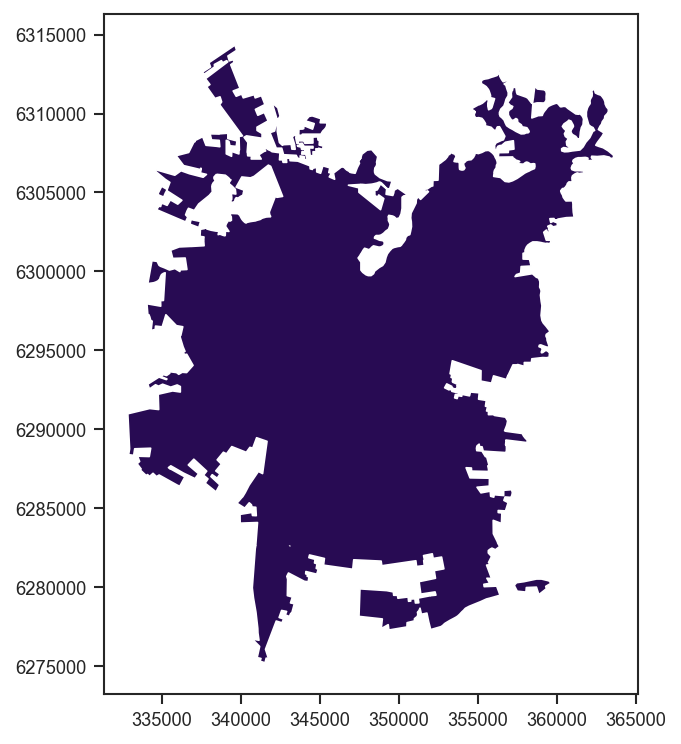

In [7]:
stgo_sf.plot()

`Note that coordinate system is not in degrees. Should be converted. `

In [8]:
stgo_shape = stgo_sf.to_crs({'init': 'epsg:4326'})

In [9]:
stgo_shape

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
385,Santiago,Ciudad,427491.444262,5.821041e+08,(POLYGON ((-70.73662882538488 -33.371762170851...


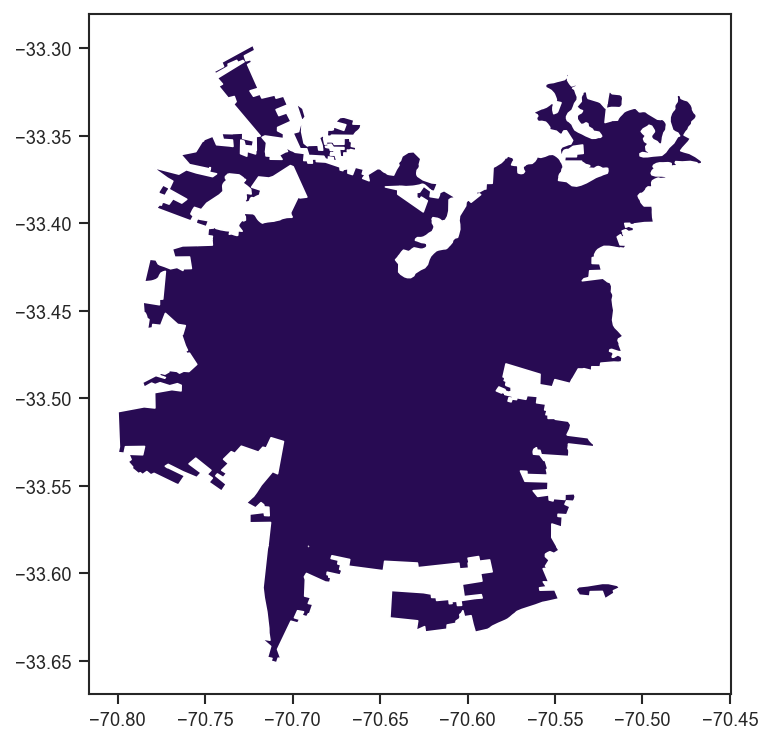

In [10]:
stgo_shape.plot()

In [11]:
stgo_shape.total_bounds

array([-70.79976813, -33.65120143, -70.46601154, -33.29815073])

In [12]:
stgo_shape.centroid

385    POINT (-70.64162309645684 -33.4742552013995)
dtype: object

`Plotting only the boundary as a line.`

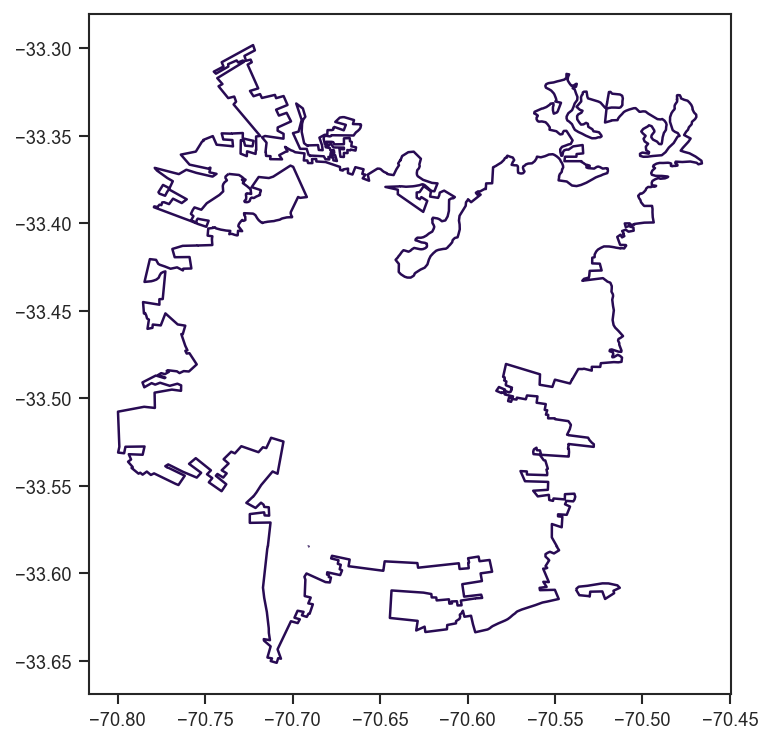

In [13]:
stgo_shape.boundary.plot()

---

## Import Roads Dataset

In [14]:
roads_path = "../data/OSM_Chile/chile-latest-free/gis_osm_roads_free_1.shp"
roads = gpd.read_file(roads_path, encoding='utf-8')
roads.shape

(454572, 11)

In [15]:
roads = gpd.sjoin(roads, stgo_shape, op='intersects')

In [16]:
roads.head()

,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry,index_right,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area
0,7981156,5121,unclassified,21 de Mayo,None,B,0,0,F,F,"LINESTRING (-70.6502258 -33.4348941, -70.65025...",385,Santiago,Ciudad,427491.444262,5.821041e+08
1,7981159,5114,secondary,Irene Morales,None,F,0,0,F,F,"LINESTRING (-70.6369668 -33.4368647, -70.63678...",385,Santiago,Ciudad,427491.444262,5.821041e+08
2,7981160,5122,residential,Rosas,None,F,0,0,F,F,"LINESTRING (-70.6502258 -33.4348941, -70.65027...",385,Santiago,Ciudad,427491.444262,5.821041e+08
3,7981313,5134,secondary_link,Teatinos,None,F,0,0,F,F,"LINESTRING (-70.65496779999999 -33.4325107, -7...",385,Santiago,Ciudad,427491.444262,5.821041e+08
4,7981317,5113,primary,San Antonio,None,F,0,0,F,F,"LINESTRING (-70.6487212 -33.433093, -70.648747...",385,Santiago,Ciudad,427491.444262,5.821041e+08


In [17]:
roads.shape

(82859, 16)

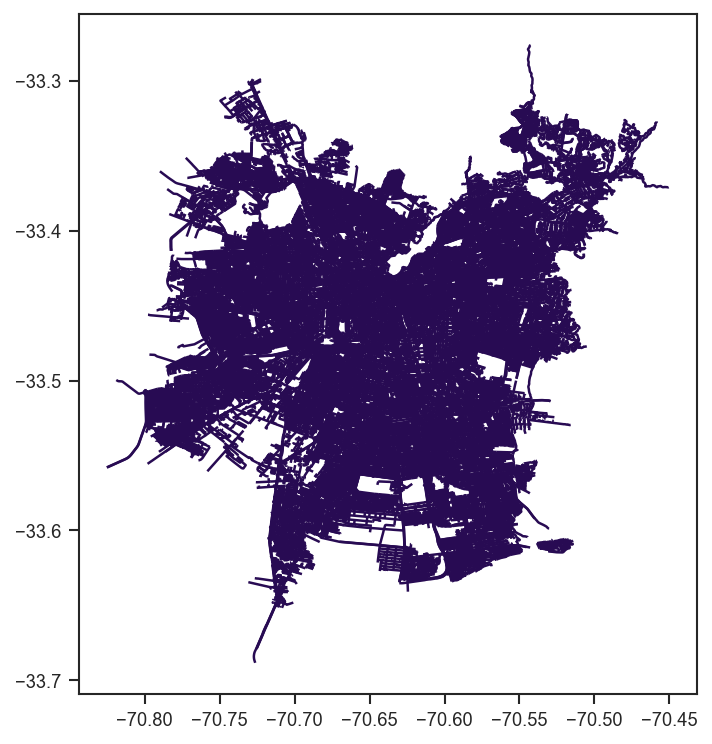

In [18]:
roads.plot()

In [19]:
roads.fclass.value_counts()

residential       31592
living_street     14810
service           12188
footway           10222
tertiary           3516
secondary          3004
primary            2985
motorway            833
primary_link        773
motorway_link       694
pedestrian          540
steps               358
unclassified        350
secondary_link      324
cycleway            248
tertiary_link       165
path                157
track                93
track_grade2          4
track_grade1          1
track_grade3          1
bridleway             1
Name: fclass, dtype: int64

In [255]:
car_roads = roads[(roads.fclass == 'tertiary') |
                  (roads.fclass == 'tertiary_link') |
                  (roads.fclass == 'secondary') |
                  (roads.fclass == 'secondary_link') |
                  (roads.fclass == 'primary') |
                  (roads.fclass == 'primary_link') |
                  (roads.fclass == 'motorway') |
                  (roads.fclass == 'motorway_linkt')]
car_roads.shape

(11600, 16)

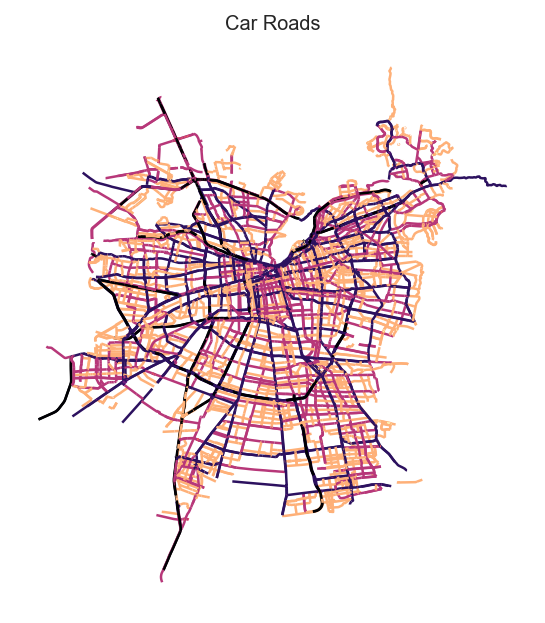

In [324]:
car_roads.plot(markersize=0.01, column='fclass',figsize=(5, 5), cmap = 'magma');
plt.axis('off');
plt.title("Car Roads");

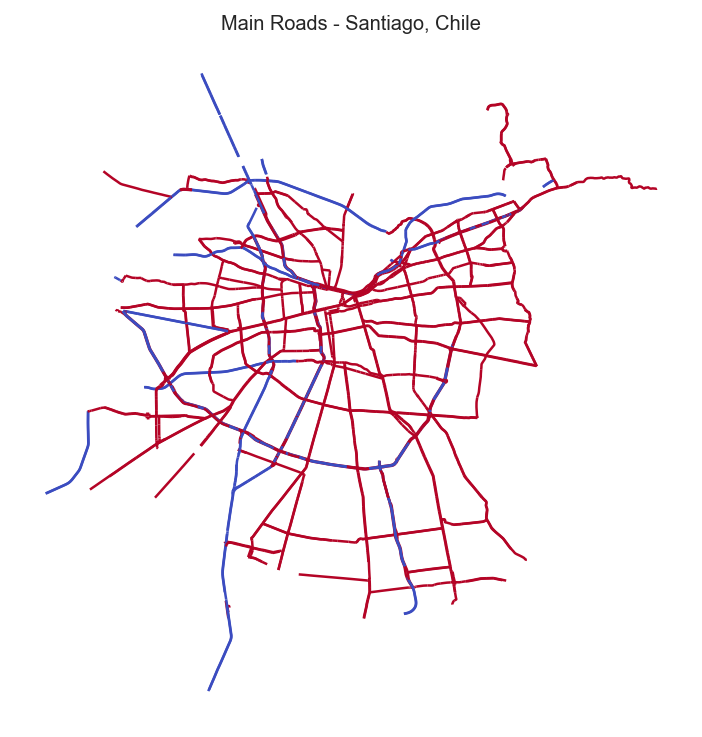

In [326]:
main_roads = car_roads[(car_roads.fclass == 'primary') |
                       (car_roads.fclass == 'motorway')
                      ]
main_roads.plot(column='fclass', cmap = 'coolwarm')
plt.axis('off');
plt.title("Main Roads - Santiago, Chile");

---

## Importing Car Crashes

In [23]:
!ls ../data/CONASET

RM_Crashes_2013_2018   SiniestrosRM2014       SiniestrosRM2017
STGO_Crashes_2013_2018 SiniestrosRM2015       SiniestrosRM2018
SiniestrosRM2013       SiniestrosRM2016


In [24]:
df_2018 = gpd.read_file("../data/CONASET/SiniestrosRM2018/SiniestrosRM2018.shp", encoding='utf-8')
df_2018.shape

(23939, 46)

In [25]:
p0 = Point(0,0)
df_p0 = df_2018['geometry'] == p0
df_p0.sum()

3537

In [26]:
s_2018 = df_2018[df_2018['geometry'] != p0]
s_2018.shape

(20402, 46)

In [203]:
crashes = gpd.sjoin(s_2018, stgo_shape, op='intersects')

In [204]:
crashes.head()

,FID,id,Ano,IdAccident,Fecha,Hora,Cod_Comuna,Comuna,Cod_Region,Region,...,Menos_Grav,Leves,lat,lng,geometry,index_right,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area
0,1,1201,2018,1071943,19/01/2018,14:50,13103,CERRO NAVIA,13,REGION METROPOLITANA,...,0,2,-33.419315,-70.741219,POINT (-70.741219 -33.41931500000002),385,Santiago,Ciudad,427491.444262,5.821041e+08
1,2,1202,2018,1070251,19/01/2018,15:10,13101,SANTIAGO,13,REGION METROPOLITANA,...,0,0,-33.446125,-70.642616,POINT (-70.642616 -33.446125),385,Santiago,Ciudad,427491.444262,5.821041e+08
2,3,1203,2018,1073179,19/01/2018,15:50,13104,CONCHALI,13,REGION METROPOLITANA,...,0,0,-33.371021,-70.676537,POINT (-70.676537 -33.371021),385,Santiago,Ciudad,427491.444262,5.821041e+08
3,4,1204,2018,1074567,19/01/2018,16:00,13120,NUNOA,13,REGION METROPOLITANA,...,0,1,-33.464638,-70.598236,POINT (-70.598236 -33.464638),385,Santiago,Ciudad,427491.444262,5.821041e+08
4,5,1205,2018,1070256,19/01/2018,16:15,13101,SANTIAGO,13,REGION METROPOLITANA,...,0,1,-33.436550,-70.643387,POINT (-70.643387 -33.43655),385,Santiago,Ciudad,427491.444262,5.821041e+08


In [205]:
del crashes['index_right']
del crashes['NOMBRE']
del crashes['TIPO_AREA']
del crashes['SHAPE_Leng']
del crashes['SHAPE_Area']

(-70.844025595, -70.431723705, -33.69818925328633, -33.27910128098692)

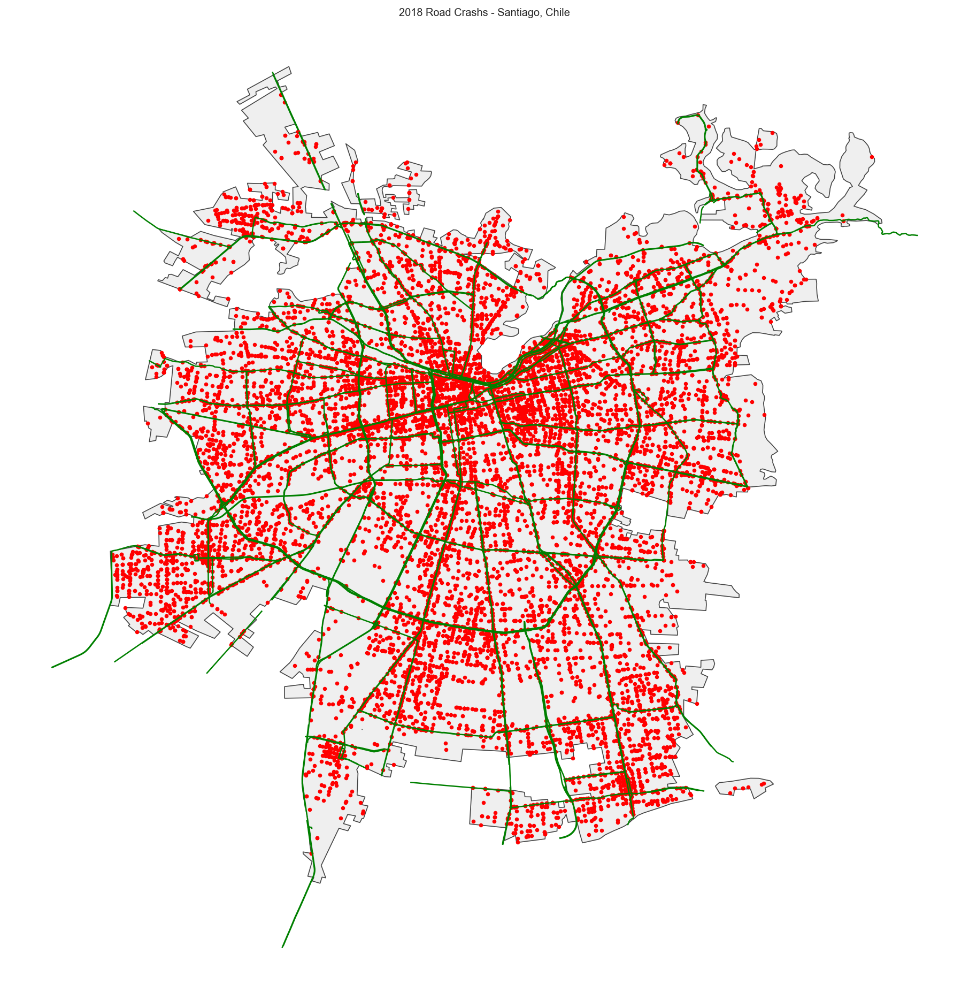

In [44]:
ax = stgo_shape.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='green', markersize=0.2)
crashes.plot(ax=ax, color='red', markersize=8)
plt.title("2018 Road Crashs - Santiago, Chile")
plt.axis('off')

## Digging into data

In [206]:
crashes.head(2)

,FID,id,Ano,IdAccident,Fecha,Hora,Cod_Comuna,Comuna,Cod_Region,Region,...,CondicionC,Cod_Esta_1,EstadoAtmo,Fallecidos,Graves,Menos_Grav,Leves,lat,lng,geometry
0,1,1201,2018,1071943,19/01/2018,14:50,13103,CERRO NAVIA,13,REGION METROPOLITANA,...,SECO,1,DESPEJADO,0,0,0,2,-33.419315,-70.741219,POINT (-70.741219 -33.41931500000002)
1,2,1202,2018,1070251,19/01/2018,15:10,13101,SANTIAGO,13,REGION METROPOLITANA,...,SECO,1,DESPEJADO,0,0,0,0,-33.446125,-70.642616,POINT (-70.642616 -33.446125)


In [207]:
crashes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 19276 entries, 0 to 23938
Data columns (total 46 columns):
FID           19276 non-null int64
id            19276 non-null int64
Ano           19276 non-null int64
IdAccident    19276 non-null int64
Fecha         19276 non-null object
Hora          19276 non-null object
Cod_Comuna    19276 non-null int64
Comuna        19276 non-null object
Cod_Region    19276 non-null int64
Region        19276 non-null object
Cod_TipoAc    19276 non-null int64
TipoAccide    19276 non-null object
CodTipo_CO    19276 non-null int64
Tipo_CONAS    19276 non-null object
Cod_Zona      19276 non-null int64
Zona          19276 non-null object
Cod_Ubicac    19276 non-null int64
UbicacionR    19276 non-null object
Cod_Causa_    19276 non-null int64
Causa_CONA    19276 non-null object
Cod_Causa     19276 non-null int64
Causa         19276 non-null object
Cod_Calle_    19276 non-null int64
CalleUno      19276 non-null object
Cod_CalleD    19276 non-null int

In [32]:
crashes.Tipo_CONAS.value_counts()

COLISION     11312
CHOQUE        4578
ATROPELLO     1917
VOLCADURA      517
OTRO TIPO      499
CAIDA          449
INCENDIO         4
Name: Tipo_CONAS, dtype: int64

In [47]:
crashes.Zona.value_counts()

URBANA    19255
RURAL        21
Name: Zona, dtype: int64

In [48]:
crashes.UbicacionR.value_counts()

TRAMO DE VIA RECTA                8281
CRUCE CON SEMAFORO FUNCIONANDO    5134
CRUCE CON SE                      2750
OTROS NO CONSIDERADOS             2053
CRUCE SIN SE                       553
ACERA O BERMA                      267
CRUCE CON SEMAFORO APAGADO          62
ROTONDA                             47
TRAMO DE VIA CURVA HORIZONTAL       36
ENLACE A NIVEL                      27
TRAMO DE VIA CURVA VERTICAL         26
TUNEL                               21
ACCESO NO HABILITADO                 7
CRUCE REGULADO POR CARABINERO        6
ENLACE A DESNIVEL                    5
PLAZA DE PEAJE                       1
Name: UbicacionR, dtype: int64

In [49]:
crashes.Calzada.value_counts()

BIDIRECCIONAL                 9159
UNIDIRECCIONAL                5903
BIDIRECCIONAL CON BANDEJON    4214
Name: Calzada, dtype: int64

In [50]:
crashes.TipoCalzad.value_counts()

ASFALTO     10712
CONCRETO     8234
MIXTO         286
ADOQUIN        41
TIERRA          3
Name: TipoCalzad, dtype: int64

In [51]:
crashes.CondicionC.value_counts()

SECO          18516
HUMEDO          383
MOJADO          303
OTROS            43
ESCARCHA          9
CON ACEITE        9
GRAVILLA          6
CON BARRO         4
Name: CondicionC, dtype: int64

In [52]:
crashes.EstadoAtmo.value_counts()

DESPEJADO    17901
NUBLADO       1033
LLUVIA         264
LLOVIZNA        55
NEBLINA         22
NIEVE            1
Name: EstadoAtmo, dtype: int64

## Visualization

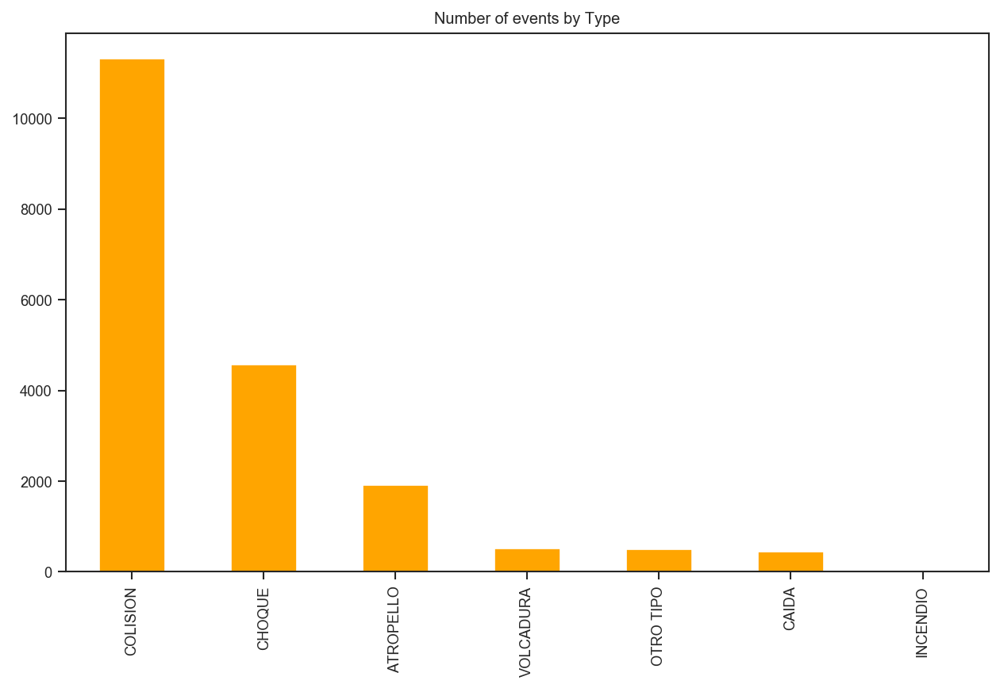

In [116]:
type = crashes.Tipo_CONAS.value_counts()
type.plot.bar(title="Number of events by Type", color = 'orange');

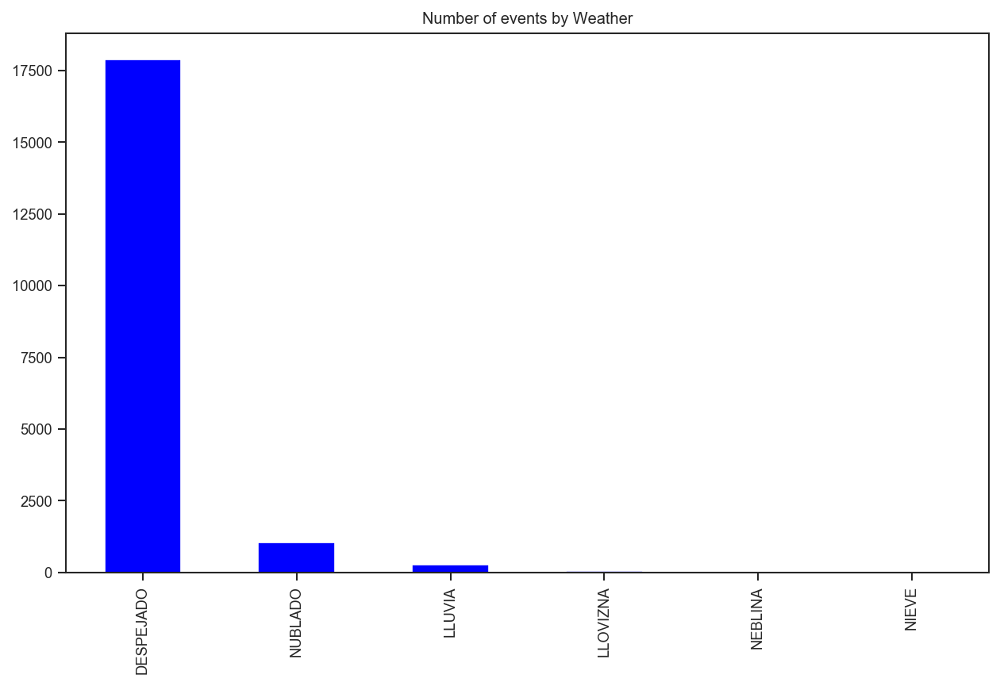

In [114]:
weather = crashes.EstadoAtmo.value_counts()
weather.plot.bar(title="Number of events by Weather", color = 'blue');

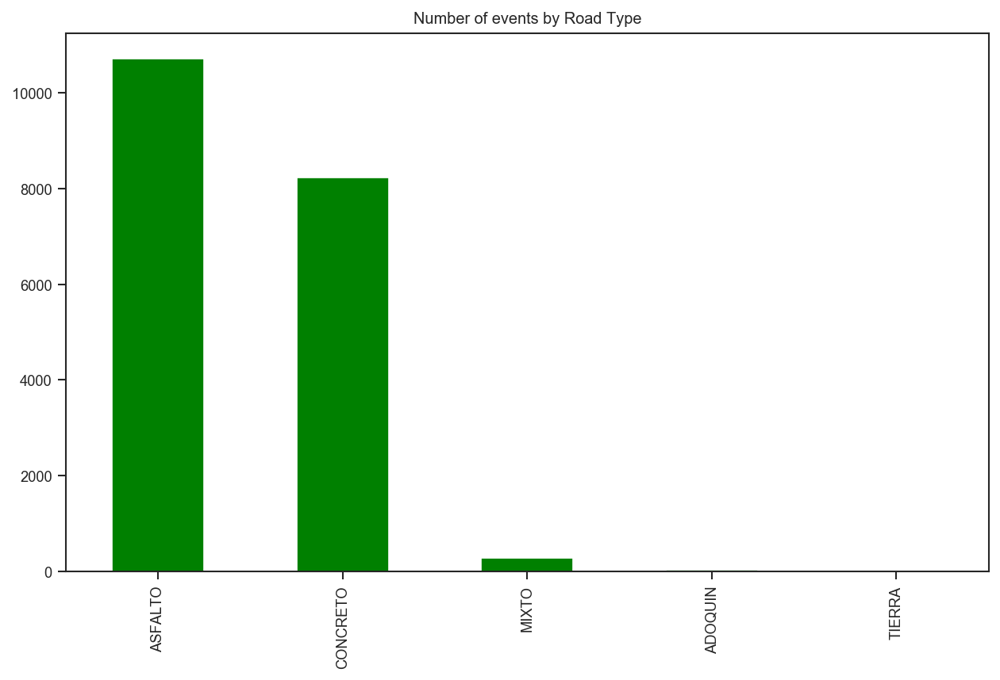

In [81]:
road_type = crashes.TipoCalzad.value_counts()
road_type.plot.bar(title="Number of events by Road Type", color = 'green')

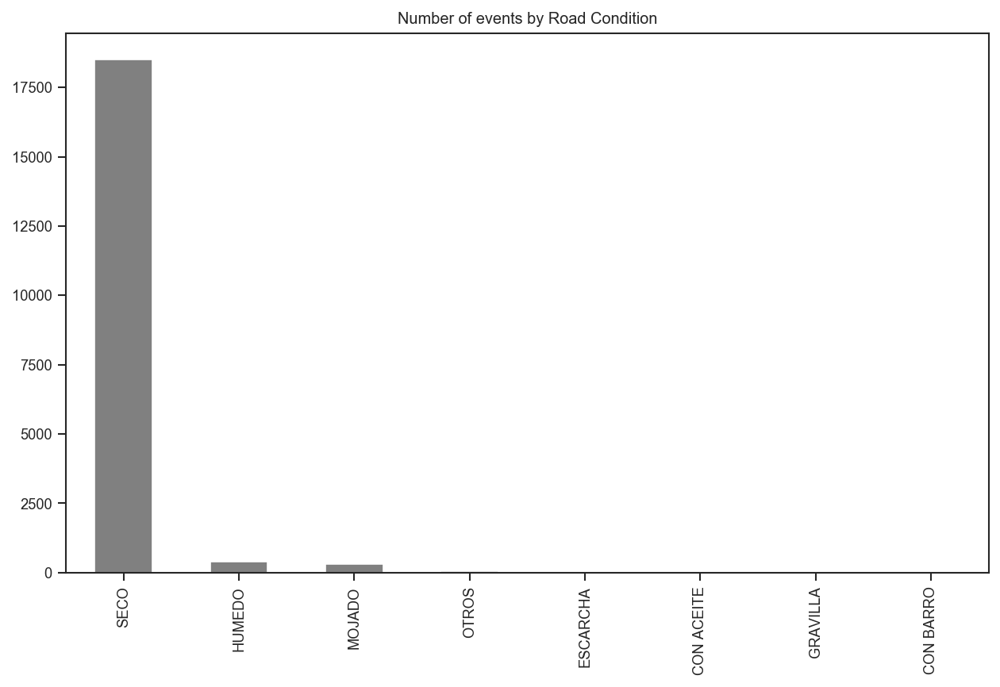

In [83]:
road_cond = crashes.CondicionC.value_counts()
road_cond.plot.bar(title="Number of events by Road Condition", color = 'gray')

In [208]:
crashes['Fecha'] = pd.to_datetime(crashes['Fecha'])
crashes['Hora'] = pd.to_datetime(crashes['Hora'])

In [209]:
crashes['month'] = crashes['Fecha'].dt.month
crashes['day'] = crashes['Fecha'].dt.day
crashes['weekday'] = crashes['Fecha'].dt.weekday_name
crashes['hour'] = crashes['Hora'].dt.hour

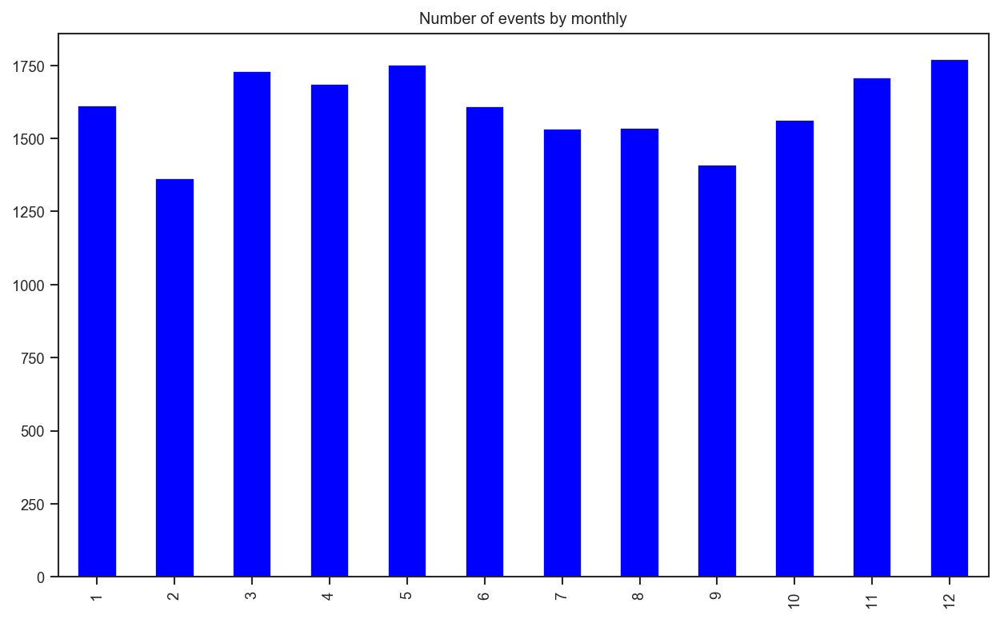

In [210]:
month = (crashes.month.value_counts()).sort_index()
month.plot.bar(title="Number of events by monthly", color = 'blue');

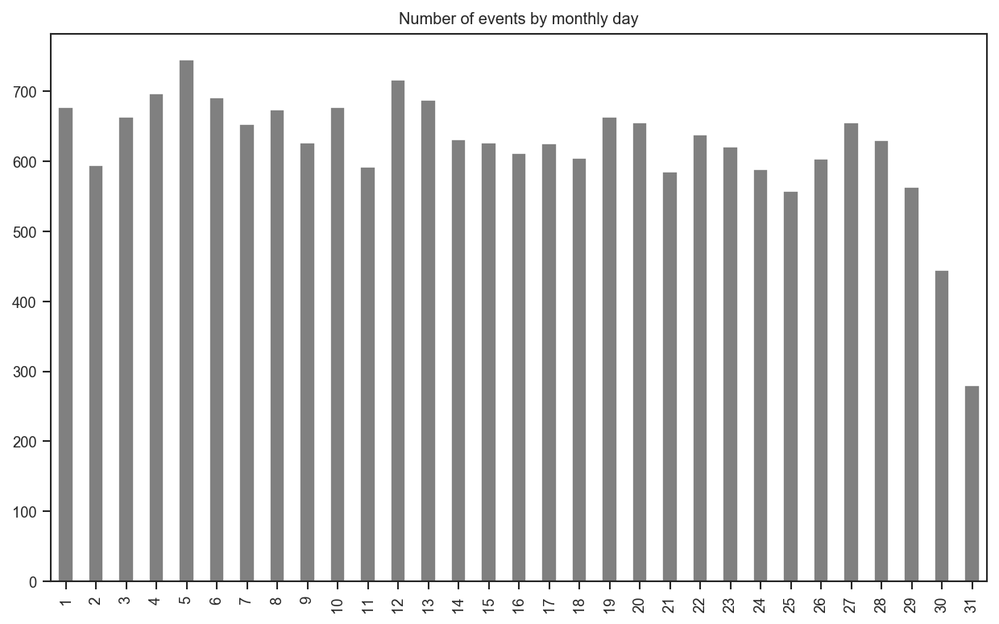

In [135]:
day = (crashes.day.value_counts()).sort_index()
day.plot.bar(title="Number of events by monthly day", color = 'gray');

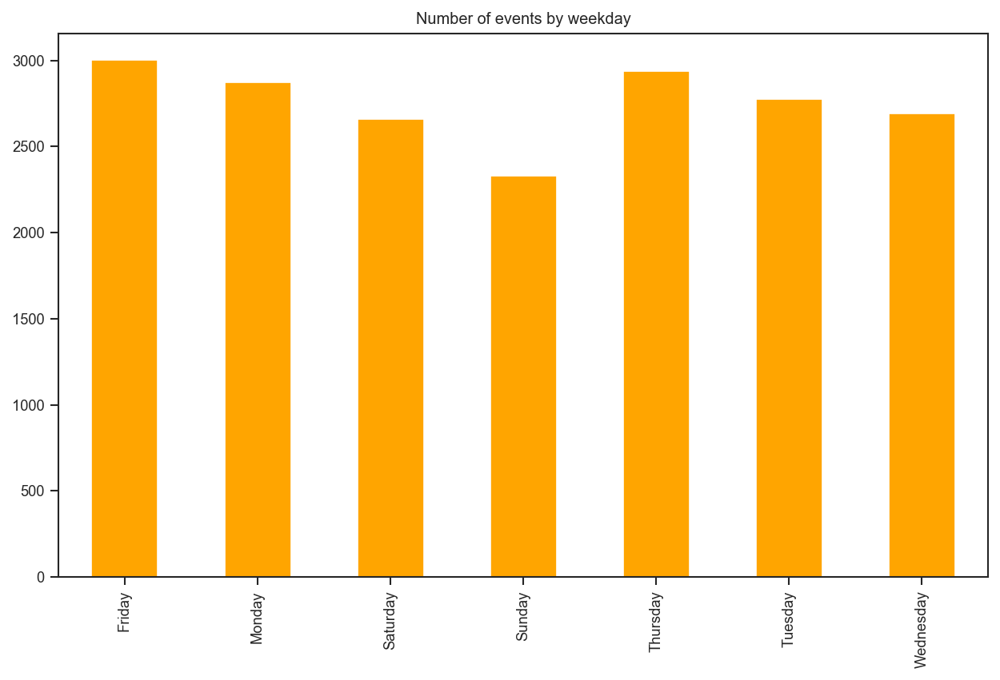

In [142]:
weekday = (crashes.weekday.value_counts()).sort_index()
weekday.plot.bar(title="Number of events by weekday", color = 'orange');

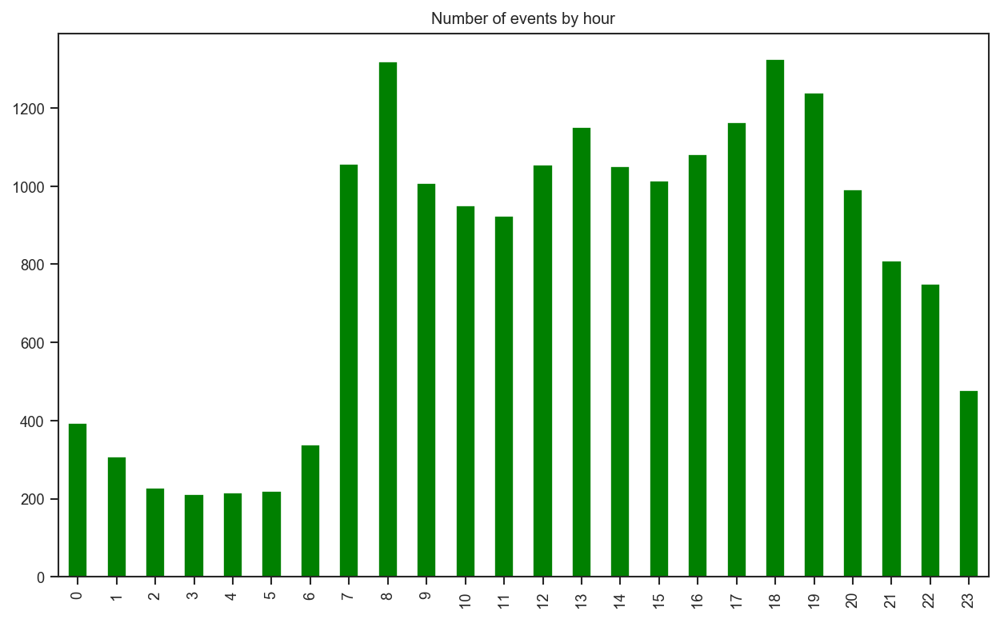

In [134]:
hour = (crashes.hour.value_counts()).sort_index()
hour.plot.bar(title="Number of events by hour", color = 'green');

## Splitting the city in zones

- [Dataset can be downloaded from SECTRA (Transport Planning Secretary - Chile)](http://www.sectra.gob.cl/encuestas_movilidad/encuestas_movilidad.htm)

In [192]:
!ls ../data/Zonificacion_EOD2012/

ZONIFICACION_EOD2012.DBF Zonificacion_EOD2012.shp
Zonificacion_EOD2012.prj Zonificacion_EOD2012.shx


In [227]:
zones = (gpd.read_file('../data/Zonificacion_EOD2012/').set_index('ID'))
zones.head()

,AREA,Zona,Com,Comuna,geometry
ID,,,,,
103,837.7500,103.0,13105,El Bosque,"POLYGON ((346376.6925730131 6286027.028697187,..."
104,998.8125,104.0,13105,El Bosque,"POLYGON ((344151.2352592435 6285465.039511388,..."
106,286.2500,106.0,13105,El Bosque,"POLYGON ((344415.4339754293 6285878.048256716,..."
115,857.4375,115.0,13105,El Bosque,"POLYGON ((344415.4339754293 6285878.048256716,..."
116,853.9375,116.0,13105,El Bosque,"POLYGON ((345133.4208225487 6286261.982521651,..."


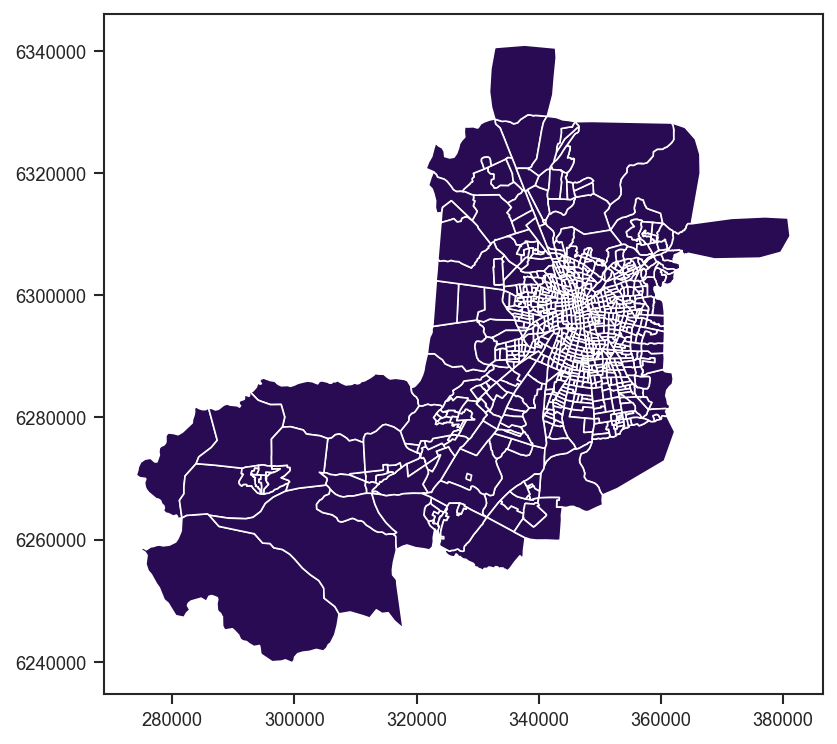

In [228]:
zones.plot()

In [229]:
zones = zones.to_crs({'init': 'epsg:4326'})

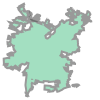

In [230]:
stgo = stgo_shape.geometry.values[0]
stgo

In [231]:
def intersection(municipality, urban_area):
    return municipality.intersection(urban_area)

def urban_part(municipality):
    return intersection(municipality, stgo)

In [232]:
urban_zones = (zones.copy()
               .assign(geometry=lambda df_: df_.geometry.buffer(0).map(urban_part))
               .pipe(lambda df_: df_[~df_.is_empty].copy())
               .to_crs({'init': 'epsg:4326'}))
urban_zones.shape

(743, 5)

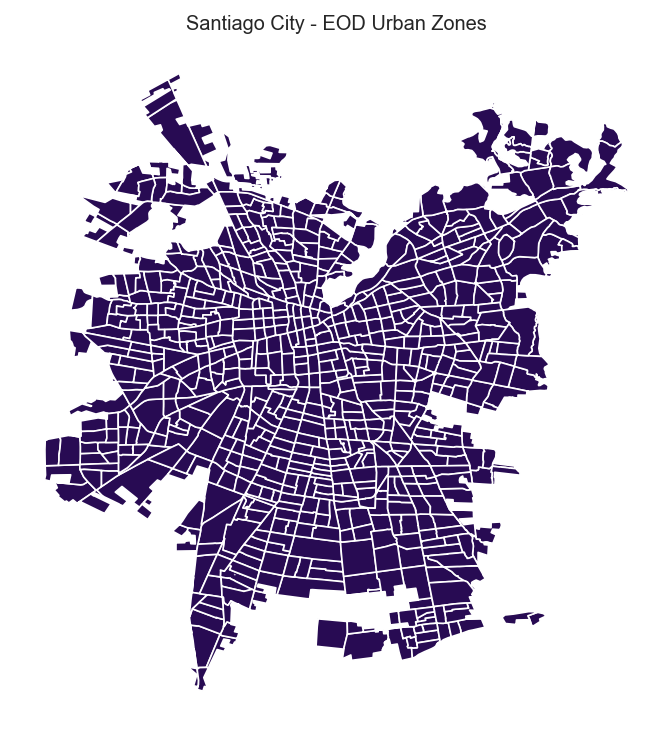

In [249]:
urban_zones.plot();
plt.axis('off');
plt.title("Santiago City - EOD Urban Zones");

## Aggregating events to city zones and creating a Heat Map

In [233]:
crash_zone_2018 = gpd.sjoin(urban_zones, crashes, how='left', op='intersects')
crash_zone_2018.head()

,AREA,Zona_left,Com,Comuna_left,geometry,index_right,FID,id,Ano,IdAccident,...,Graves,Menos_Grav,Leves,lat,lng,month,day,weekday,hour,SEV_Index
103,837.75,103.0,13105,El Bosque,POLYGON ((-70.65484700000178 -33.5543640000008...,738.0,739.0,1539.0,2018.0,1073222.0,...,0.0,0.0,0.0,-33.561188,-70.656555,1.0,24.0,Wednesday,20.0,1.0
103,837.75,103.0,13105,El Bosque,POLYGON ((-70.65484700000178 -33.5543640000008...,15313.0,14314.0,14714.0,2018.0,1122889.0,...,1.0,0.0,0.0,-33.561188,-70.656555,11.0,8.0,Thursday,19.0,4.0
103,837.75,103.0,13105,El Bosque,POLYGON ((-70.65484700000178 -33.5543640000008...,19377.0,20439.0,20421.0,2018.0,1145347.0,...,0.0,0.0,2.0,-33.561188,-70.656555,12.0,11.0,Tuesday,9.0,2.0
103,837.75,103.0,13105,El Bosque,POLYGON ((-70.65484700000178 -33.5543640000008...,2903.0,1904.0,1104.0,2018.0,1069662.0,...,1.0,0.0,0.0,-33.560457,-70.656374,1.0,18.0,Thursday,7.0,4.0
103,837.75,103.0,13105,El Bosque,POLYGON ((-70.65484700000178 -33.5543640000008...,21550.0,18612.0,19407.0,2018.0,1140951.0,...,0.0,0.0,0.0,-33.559635,-70.661003,10.0,26.0,Friday,12.0,1.0


In [236]:
crash_zone_2018 = crash_zone_2018.fillna(0)

In [237]:
crash_zone_2018 = crash_zone_2018.rename(columns={'index_right':'crashes'})

In [238]:
crash_zone_2018['crashes'] = crash_zone_2018['crashes'].apply(lambda x: 0 if x== 0 else 1)
crash_zone_2018.crashes.value_counts()

1    19173
0       17
Name: crashes, dtype: int64

In [239]:
crash_zone_2018 = crash_zone_2018.groupby('Zona_left', as_index=False).agg({
  'crashes': 'sum', 
  'geometry': 'first',
  })
crash_zone_2018 = gpd.GeoDataFrame(crash_zone_2018, crs='4326')

In [240]:
crash_zone_2018.shape

(743, 3)

In [243]:
crash_zone_2018 = gi.copy()

In [244]:
crash_zone_2018.sample(10)

,Zona_left,crashes,geometry
286,287.0,79,POLYGON ((-70.60566700000152 -33.4148630000007...
341,342.0,0,POLYGON ((-70.68650200000195 -33.5162050000007...
647,655.0,25,POLYGON ((-70.64502700000172 -33.5311110000007...
108,109.0,25,POLYGON ((-70.67262100000187 -33.5657860000007...
4,5.0,21,POLYGON ((-70.67306400000189 -33.4432680000007...
176,177.0,21,POLYGON ((-70.67083300000188 -33.5108540000007...
522,526.0,31,POLYGON ((-70.75460500000243 -33.4505500000007...
227,228.0,14,POLYGON ((-70.59584800000147 -33.5284360000008...
54,55.0,4,POLYGON ((-70.71292500000213 -33.4829580000007...
551,559.0,27,POLYGON ((-70.70180500000204 -33.4207560000007...


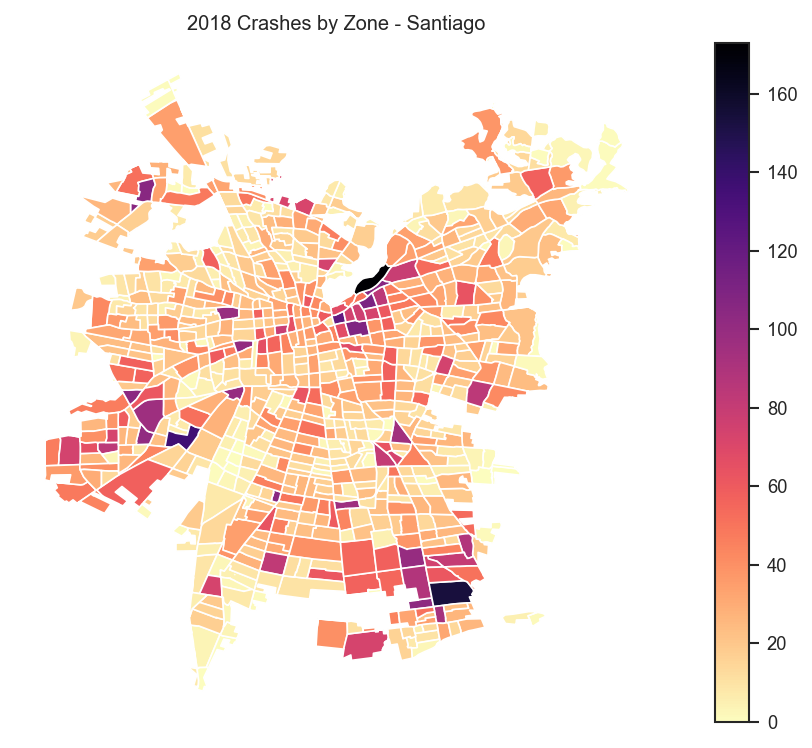

In [246]:
ax = crash_zone_2018.plot(column='crashes', cmap='magma_r', k=5, legend=True)
plt.title("2018 Crashes by Zone - Santiago");
ax.set_axis_off()

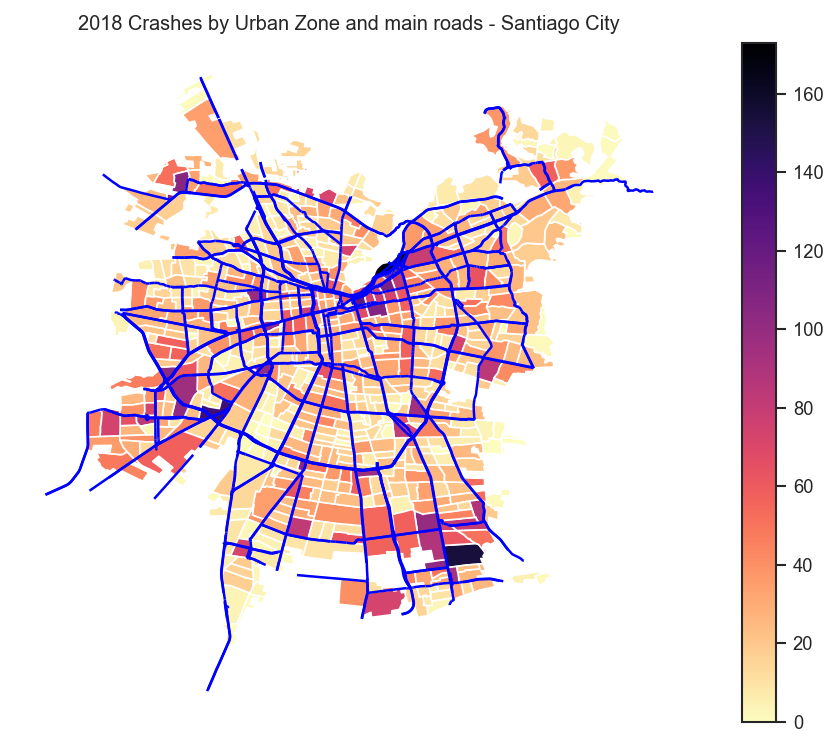

In [252]:
fig, ax = plt.subplots(figsize = (10,6)) 
crash_zone_2018.plot(ax=ax, column='crashes', cmap='magma_r', k=5, legend=True)
main_roads.plot(ax=ax, color = 'blue')
plt.title("2018 Crashes by Urban Zone and main roads - Santiago City");
ax.set_axis_off();

## Topographic Map

In [214]:
def plot_point_distribution(**kwargs):
    #print(kwargs)
    ax = plt.gca()
    
    # context!
    context.plot(ax=ax, alpha=0.7, color='grey')
    
    color = kwargs.pop('color')
    geodf = kwargs.pop('data')
    bounds = kwargs.pop('bounds', None)

    sns.kdeplot(geodf.geometry.x, geodf.geometry.y, **kwargs)

    if bounds is not None:
        plt.xlim(bounds[:,0])
        plt.ylim(bounds[:,1])
    
    plt.axis('equal')
    plt.axis('off')

In [215]:
def plot_heat_map(data, label, context):
    g = sns.FacetGrid(data=data, 
                      size=6, 
                      dropna=False
                     );

    g.map_dataframe(plot_point_distribution, 
                    shade=True, 
                    alpha=0.7, 
                    cbar=True, 
                    cmap='magma_r', 
                    cbar_kws={'orientation': 'horizontal',
                              'label': label,
                              'fraction': 0.02,
                              'shrink': 0.35,
                              'pad': 0}
                   );

In [259]:
context = urban_zones.to_crs({'init': 'epsg:4326'})

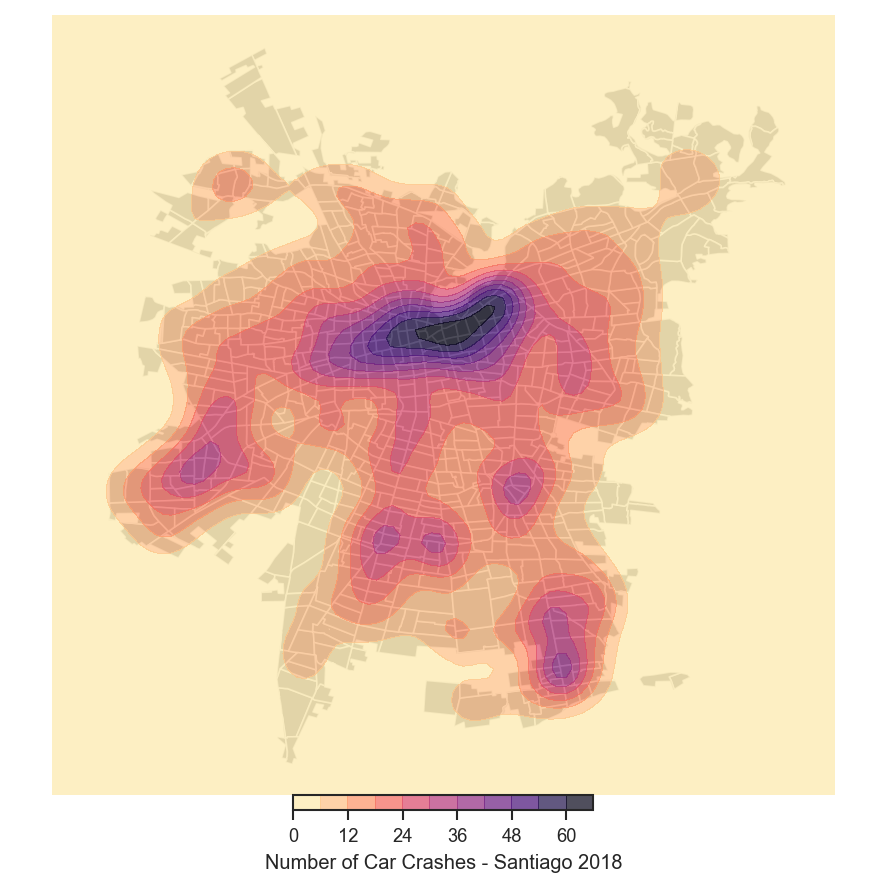

In [260]:
plot_heat_map(crashes, 'Number of Car Crashes - Santiago 2018', context)

## Creating a Severity Index

In [211]:
def sev_index_crash(row):
    if row['Fallecidos'] != 0: return 5
    elif row['Graves'] !=0: return 4
    elif row['Menos_Grav'] !=0: return 3
    elif row['Leves'] !=0: return 2
    else: return 1

In [212]:
crashes['SEV_Index'] = crashes.apply(sev_index_crash, axis=1)
crashes.SEV_Index.value_counts()

1    11632
2     5311
4     1584
3      587
5      162
Name: SEV_Index, dtype: int64

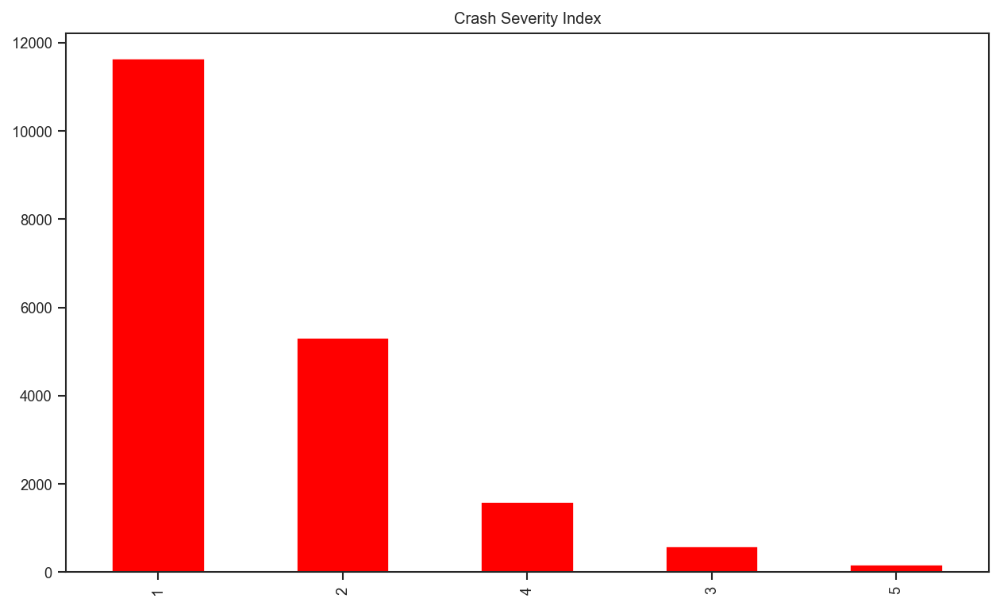

In [213]:
SEV_Index = crashes.SEV_Index.value_counts()
SEV_Index.plot.bar(title="Crash Severity Index", color = 'red');

## Associating severity index to roads

`For each road collect the crashes near it`

In [263]:
car_roads.head(2)

,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry,index_right,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area
1,7981159,5114,secondary,Irene Morales,None,F,0,0,F,F,"LINESTRING (-70.6369668 -33.4368647, -70.63678...",385,Santiago,Ciudad,427491.444262,5.821041e+08
3,7981313,5134,secondary_link,Teatinos,None,F,0,0,F,F,"LINESTRING (-70.65496779999999 -33.4325107, -7...",385,Santiago,Ciudad,427491.444262,5.821041e+08


In [264]:
r = roads[['geometry', 'osm_id', 'name', 'fclass']].copy()

`Buffer crash points`
- once we are working with angles in degrees, we must convert meters to degrees:- 
- deg = (meters * 0.1) / 11000

In [265]:
meters = 5
buffer = (meters*0.1)/11000  # degrees

In [266]:
crashes.head()

,FID,id,Ano,IdAccident,Fecha,Hora,Cod_Comuna,Comuna,Cod_Region,Region,...,Menos_Grav,Leves,lat,lng,geometry,month,day,weekday,hour,SEV_Index
0,1,1201,2018,1071943,2018-01-19,2019-08-13 14:50:00,13103,CERRO NAVIA,13,REGION METROPOLITANA,...,0,2,-33.419315,-70.741219,POINT (-70.741219 -33.41931500000002),1,19,Friday,14,2
1,2,1202,2018,1070251,2018-01-19,2019-08-13 15:10:00,13101,SANTIAGO,13,REGION METROPOLITANA,...,0,0,-33.446125,-70.642616,POINT (-70.642616 -33.446125),1,19,Friday,15,1
2,3,1203,2018,1073179,2018-01-19,2019-08-13 15:50:00,13104,CONCHALI,13,REGION METROPOLITANA,...,0,0,-33.371021,-70.676537,POINT (-70.676537 -33.371021),1,19,Friday,15,1
3,4,1204,2018,1074567,2018-01-19,2019-08-13 16:00:00,13120,NUNOA,13,REGION METROPOLITANA,...,0,1,-33.464638,-70.598236,POINT (-70.598236 -33.464638),1,19,Friday,16,2
4,5,1205,2018,1070256,2018-01-19,2019-08-13 16:15:00,13101,SANTIAGO,13,REGION METROPOLITANA,...,0,1,-33.436550,-70.643387,POINT (-70.643387 -33.43655),1,19,Friday,16,2


In [270]:
c = crashes[['geometry', 'SEV_Index']].copy()
c['geometry'] = c['geometry'].buffer(buffer)

`Spatial-join roads and buffered crash points` 

In [274]:
f = gpd.sjoin(r, c, how='inner', op='intersects')

In [275]:
f.head()

,geometry,osm_id,name,fclass,index_right,SEV_Index
2,"LINESTRING (-70.6502258 -33.4348941, -70.65027...",7981160,Rosas,residential,11741,2
2,"LINESTRING (-70.6502258 -33.4348941, -70.65027...",7981160,Rosas,residential,23840,2
6,"LINESTRING (-70.6531971 -33.4331471, -70.65307...",7991807,Ismael Valdes Vergara,secondary,7966,1
150227,"LINESTRING (-70.6516689 -33.4342333, -70.65170...",149899874,Puente,living_street,7966,1
6,"LINESTRING (-70.6531971 -33.4331471, -70.65307...",7991807,Ismael Valdes Vergara,secondary,20483,2


- Assign a crash score to each road.
- Define the number of crashes per meter.
- Define crashes by severity

In [293]:
f['num_crashes'] = 1
g = f.groupby('osm_id', as_index=False).agg({
  'name': 'first',
  'num_crashes': 'sum', 
  'SEV_Index': 'sum',
  'geometry': 'first',
  })
g = gpd.GeoDataFrame(g, crs='4326')

In [294]:
g.head()

,osm_id,name,num_crashes,SEV_Index,geometry
0,100052645,Corredor Transantiago Grecia,27,39,"LINESTRING (-70.55450039999999 -33.4736004, -7..."
1,101852653,Avenida Mariano Sánchez Fontecilla,1,1,"LINESTRING (-70.5543962 -33.473508, -70.554374..."
2,101873017,Intercomunal Troncal San Francisco,2,4,"LINESTRING (-70.6112924 -33.5705018, -70.61086..."
3,102186419,Batallón Chacabuco,3,4,"LINESTRING (-70.6098958 -33.5902319, -70.61028..."
4,102319867,Avenida La Serena,1,3,"LINESTRING (-70.6112924 -33.5705018, -70.61135..."


In [299]:
top_danger = g.sort_values(['SEV_Index'], ascending=False)[:10]
top_danger

,osm_id,name,num_crashes,SEV_Index,geometry
4285,370382513,Avenida Américo Vespucio,78,126,"LINESTRING (-70.7117787 -33.5167383, -70.71191..."
3774,300267260,Avenida Libertador Bernardo O'Higgins,85,122,"LINESTRING (-70.66453540000001 -33.4468925, -7..."
7237,48983455,Avenida Los Pajaritos,62,121,"LINESTRING (-70.7369817 -33.4712425, -70.73709..."
1775,23393817,Avenida Teniente Cruz,55,120,"LINESTRING (-70.7389223 -33.4537099, -70.73882..."
6068,447296065,Avenida Américo Vespucio Norte,70,116,"LINESTRING (-70.6486838 -33.3795996, -70.64785..."
5863,446363322,Avenida Concha y Toro,67,111,"LINESTRING (-70.5782804 -33.5979948, -70.57826..."
4869,41267621,Avenida Gabriela,57,100,"LINESTRING (-70.58164379999999 -33.5791909, -7..."
5424,442446179,Avenida Providencia,61,100,"LINESTRING (-70.60984430000001 -33.421807, -70..."
3326,268963350,Corredor Transantiago Santa Rosa,59,89,"LINESTRING (-70.6341192 -33.5425881, -70.63411..."
5081,436178805,Avenida Américo Vespucio,59,89,"LINESTRING (-70.6342887 -33.5426432, -70.63411..."


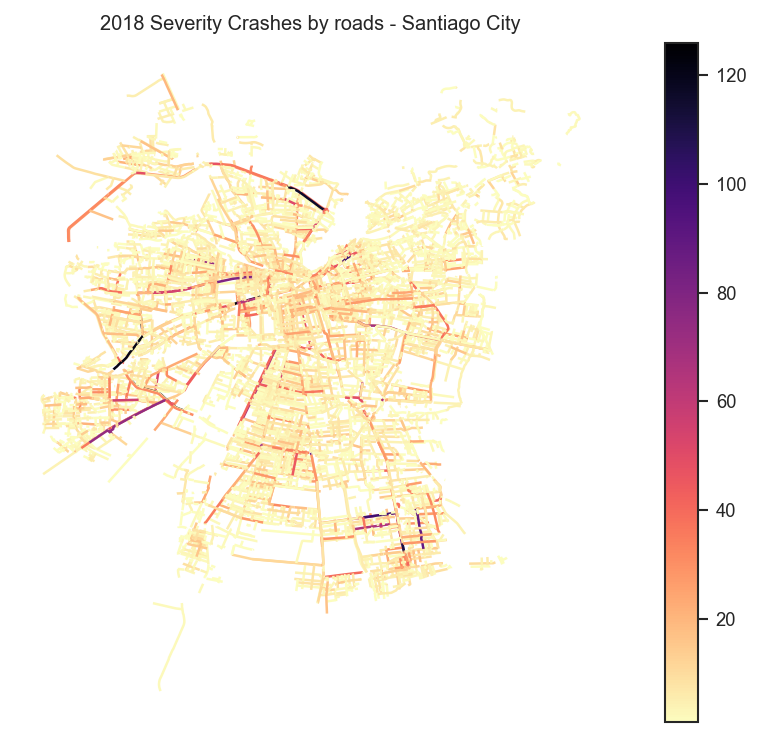

In [315]:
fig, ax = plt.subplots(figsize = (10,6)) 
g.plot(ax=ax, column='SEV_Index', cmap='magma_r', k=5, legend=True)
plt.title("2018 Severity Crashes by roads - Santiago City");
ax.set_axis_off();

In [312]:
# Color-code roads by crash score with Spectra 

print(g.describe())

# Use Colorbrewer spectral colors
colors = reversed(['#d7191c', '#d7191c','#fdae61','#ffffbf','#abdda4','#2b83ba'])  
cuts = [0] + [g['SEV_Index'].quantile(k/125) for k in [25, 50, 75, 100, 125]]
scale = spectra.scale(colors).colorspace('lch').domain(cuts)
g['color'] = g['SEV_Index'].map(lambda x: scale(x).hexcode)

       num_crashes    SEV_Index
count  8993.000000  8993.000000
mean      3.624708     5.887468
std       5.070504     8.308178
min       1.000000     1.000000
25%       1.000000     1.000000
50%       2.000000     3.000000
75%       4.000000     7.000000
max      85.000000   126.000000


In [303]:
def style(x):
    return {
        'color': x['properties']['color'],
        'weight': 5,
    }

In [313]:
lon, lat = top_danger.geometry.iat[0].coords[0]  # Center on crashiest segment road
m = folium.Map(location=[lat, lon],
               tiles="cartodbpositron",
               zoom_start=16)

geo = json.loads(g.sort_values('SEV_Index').to_json())
folium.GeoJson(geo, 
  style_function=style).add_to(m)

m